#Mini-Project 1: Introduction to Text Data and Preprocessing

##1. Collect a Text Dataset:

In [1]:
import urllib.request
url = ("https://raw.githubusercontent.com/monkeybuzinis/LLM/refs/heads/main/data/ADVENTURES_OF_HUCKLEBERRY_FINN.txt")
file_path = "huckleberry_finn.txt"
urllib.request.urlretrieve(url, file_path)

#These codes help to download the file from the specified url and saves it to the local path "huckleberry_finn.txt".

('huckleberry_finn.txt', <http.client.HTTPMessage at 0x7c95e8230150>)

In [2]:
!pip uninstall -y nltk
!pip install --upgrade nltk


#Doing both in sequence is a clean way to:
 #1. Remove any potentially corrupted or outdated version.
 #2. Reinstall the latest version fresh.

Found existing installation: nltk 3.9.1
Uninstalling nltk-3.9.1:
  Successfully uninstalled nltk-3.9.1
  Using cached nltk-3.9.1-py3-none-any.whl.metadata (2.9 kB)
Using cached nltk-3.9.1-py3-none-any.whl (1.5 MB)


In [3]:
import nltk


nltk.download('punkt')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [4]:
with open("huckleberry_finn.txt", "r", encoding="utf-8") as f:
    raw_text = f.read()
print("Total number of character:", len(raw_text))
print(raw_text[:100])

#Opens the file huckleberry_finn.txt for reading ("r" mode).
#Uses encoding="utf-8" to correctly handle special characters.
#The with block ensures the file is automatically closed after reading.
#f.read() reads the entire content of the file into the variable raw_text.

Total number of character: 562748
You don’t know about me without you have read a book by the name of The
Adventures of Tom Sawyer; bu


##2. Basic Text Cleaning:

In [5]:
import re

def clean_text(text):

    # Replace multiple periods with a single period
    text = re.sub(r'\.{2,}', '.', text)

    # List of common contractions to preserve
    contractions = [
    "'s", "'m", "'re", "'ve", "'ll", "'d", "n't",
    "can't", "won't", "ain't", "let's", "ma'am", "o'clock", "y'all",
    "should've", "would've", "could've", "gonna", "wanna", "gotta",
    "lemme", "gimme", "kinda", "sorta", "dunno"
]
    # Temporarily protect contractions by replacing them with unique placeholders
    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = re.sub(rf"\b{re.escape(contraction)}\b", placeholder, text, flags=re.IGNORECASE)

    # Separate punctuation from words (e.g., "Hello, world!" → "Hello , world !")
    text = re.sub(r'([—\-.,:;?_!"()\[\]"\'])', r' \1 ', text)

    # Remove extra whitespace
    text = " ".join(text.split())

    # Restore original contractions
    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = text.replace(placeholder, contraction)

    return text

# Example usage

cleaned_text = clean_text(raw_text)
print(cleaned_text[:200])


You don’t know about me without you have read a book by the name of The Adventures of Tom Sawyer ; but that ain’t no matter . That book was made by Mr . Mark Twain , and he told the truth , mainly . T


## 3. Split the Data into Sentences:

In [6]:
#nltk.sent_tokenize(text) uses NLTK's pre-trained sentence tokenizer to split a block of text into individual sentences.

def split_into_sentences(text):
  return nltk.sent_tokenize(text)

raw_sentences = split_into_sentences(cleaned_text)
print(raw_sentences)

['You don’t know about me without you have read a book by the name of The Adventures of Tom Sawyer ; but that ain’t no matter .', 'That book was made by Mr .', 'Mark Twain , and he told the truth , mainly .', 'There was things which he stretched , but mainly he told the truth .', 'That is nothing .', 'I never seen anybody but lied one time or another , without it was Aunt Polly , or the widow , or maybe Mary .', 'Aunt Polly — Tom’s Aunt Polly , she is — and Mary , and the Widow Douglas is all told about in that book , which is mostly a true book , with some stretchers , as I said before .', 'Now the way that the book winds up is this : Tom and me found the money that the robbers hid in the cave , and it made us rich .', 'We got six thousand dollars apiece — all gold .', 'It was an awful sight of money when it was piled up .', 'Well , Judge Thatcher he took it and put it out at interest , and it fetched us a dollar a day apiece all the year round — more than a body could tell what to do

#Mini-Project 2: Tokenization and Text Representation

## 1. Tokenize the Text:

In [7]:
all_token = cleaned_text.split()
print(len(all_token))

#Split text based on space

133901


##2. Token Encoding:

In [34]:

all_words = sorted(set(all_token))       #1
all_words.insert(0, '<UNK>')
vocab = {token:integer for integer,token in enumerate(all_words)} #2
for i, item in enumerate(vocab.items()):  #3
    print(item)
    if i >= 50:
        break
#1:
# all_token is assumed to be a list of tokens (usually words) extracted from your cleaned text.
# set(all_token) removes duplicates — leaving only unique tokens.
# sorted(...) sorts the tokens alphabetically to create a consistent orde

#2: This creates a dictionary (vocab) that maps each unique word to a unique integer ID (starting from 0).

#3: Prints the first 51 (word, id) pairs from the vocabulary.

('<UNK>', 0)
('!', 1)
('(', 2)
(')', 3)
(',', 4)
('-', 5)
('.', 6)
('1', 7)
('10', 8)
('2', 9)
('20', 10)
('21', 11)
('25', 12)
('3', 13)
('300', 14)
('4', 15)
('50', 16)
(':', 17)
(';', 18)
('?', 19)
('A', 20)
('ADMITTED', 21)
('AND', 22)
('AT', 23)
('AUNT', 24)
('Ab', 25)
('Abner', 26)
('Abolitionist', 27)
('About', 28)
('Abram', 29)
('Ab’litionist', 30)
('According', 31)
('Acts', 32)
('Adam', 33)
('Admission', 34)
('Adolphus”', 35)
('Adventures', 36)
('African', 37)
('After', 38)
('Afterwards', 39)
('Ah', 40)
('Ain’', 41)
('Ain’t', 42)
('Alas', 43)
('All', 44)
('Along', 45)
('Also', 46)
('Always', 47)
('Amen', 48)
('America', 49)
('Amighty', 50)


# Mini-Project 3: Encoding and Padding

#1. Encoding

In [39]:

def encode(tokens, vocab):
    unk_id = vocab['<UNK>']
    return [vocab.get(token, unk_id) for token in tokens]
encoded_tokens = encode(['hello', 'world'], vocab)
print(encoded_tokens)

[0, 6630]


##2. Padding Sequences:

In [9]:

# 1. Tokenize each sentence by space
tokenized_sentences = [sentence.split() for sentence in raw_sentences]

# 2. Find the maximum token‐list length
max_len = max(len(tokens) for tokens in tokenized_sentences)

# 3. Pad each token list to `max_len`
padded_sentences = [
    tokens + ["<PAD>"] * (max_len - len(tokens))
    for tokens in tokenized_sentences
]

print("Max tokens per sentence:", max_len)
print("Example padded sentence:", padded_sentences[0])


Max tokens per sentence: 310
Example padded sentence: ['You', 'don’t', 'know', 'about', 'me', 'without', 'you', 'have', 'read', 'a', 'book', 'by', 'the', 'name', 'of', 'The', 'Adventures', 'of', 'Tom', 'Sawyer', ';', 'but', 'that', 'ain’t', 'no', 'matter', '.', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', 

##3. Truncation:

In [10]:
# 1. Truncate each sentence to at most 10 tokens
truncated_sentences = [tokens[:10] for tokens in tokenized_sentences]

# Each sentence to be exactly length 10, we can pad the shorter ones:
padded_truncated = [
    tokens + ["<PAD>"] * (10 - len(tokens))
    for tokens in truncated_sentences
]

# Inspect
print(padded_sentences)
# Inspect
print("Original first sentence:", tokenized_sentences[0])
print("Truncated first sentence:", truncated_sentences[0])
print("Padded-truncated first sentence:", padded_truncated[0])


[['You', 'don’t', 'know', 'about', 'me', 'without', 'you', 'have', 'read', 'a', 'book', 'by', 'the', 'name', 'of', 'The', 'Adventures', 'of', 'Tom', 'Sawyer', ';', 'but', 'that', 'ain’t', 'no', 'matter', '.', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>', '<PAD>',

#Mini-Project 4: Creating a Data Pipeline

##1. Create a Data Preprocessing Pipeline

In [11]:
import re
import nltk
nltk.download('punkt')

def clean_text(text):
    text = re.sub(r'\.{2,}', '.', text)

    contractions = [
        "'s", "'m", "'re", "'ve", "'ll", "'d", "n't",
        "can't", "won't", "ain't", "let's", "ma'am", "o'clock", "y'all",
        "should've", "would've", "could've", "gonna", "wanna", "gotta",
        "lemme", "gimme", "kinda", "sorta", "dunno"
    ]

    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = re.sub(rf"\b{re.escape(contraction)}\b", placeholder, text, flags=re.IGNORECASE)

    text = re.sub(r'([—\-.,:;?_!"()\[\]"\'])', r' \1 ', text)
    text = " ".join(text.split())

    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = text.replace(placeholder, contraction)

    return text

def preprocessing_pipeline(raw_text, truncate_len=10):
    # Step 1: Clean text
    cleaned_text = clean_text(raw_text)

    # Step 2: Sentence splitting
    sentences = nltk.sent_tokenize(cleaned_text)

    # Step 3: Tokenize
    tokenized_sentences = [sentence.split() for sentence in sentences]

    # Step 4: Truncate and pad to fixed length
    padded_sentences = [
        tokens[:truncate_len] + ["<PAD>"] * max(0, truncate_len - len(tokens))
        for tokens in tokenized_sentences
    ]

    # Step 5: Build vocab from all words
    all_tokens = cleaned_text.split()
    vocab = {token: idx for idx, token in enumerate(sorted(set(all_tokens + ["<PAD>"])))}
    inv_vocab = {idx: token for token, idx in vocab.items()}

    # Step 6: Encode sentences
    encoded_sentences = [
        [vocab[token] for token in sentence]
        for sentence in padded_sentences
    ]

    return {
        "cleaned_text": cleaned_text,
        "tokenized": tokenized_sentences,
        "padded_tokens": padded_sentences,
        "encoded": encoded_sentences,
        "vocab": vocab,
        "inv_vocab": inv_vocab,
    }

def decode(encoded_sentence, inv_vocab):
    return [inv_vocab.get(idx, "<UNK>") for idx in encoded_sentence]


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [12]:
#Load my example
import urllib.request
url = "https://raw.githubusercontent.com/monkeybuzinis/LLM/refs/heads/main/data/ADVENTURES_OF_HUCKLEBERRY_FINN.txt"
file_path = "huckleberry_finn.txt"
urllib.request.urlretrieve(url, file_path)
with open(file_path, "r", encoding="utf-8") as f:
    raw_text = f.read()

In [13]:
data = preprocessing_pipeline(raw_text, truncate_len=10)

print("Original cleaned text snippet:\n", data["cleaned_text"][:300])
print("\nExample tokenized sentence:\n", data["tokenized"][0])
print("\nExample padded token list:\n", data["padded_tokens"][0])
print("\nExample encoded sentence:\n", data["encoded"][0])
print("\nDecoded from encoded:\n", decode(data["encoded"][0], data["inv_vocab"]))


Original cleaned text snippet:
 You don’t know about me without you have read a book by the name of The Adventures of Tom Sawyer ; but that ain’t no matter . That book was made by Mr . Mark Twain , and he told the truth , mainly . There was things which he stretched , but mainly he told the truth . That is nothing . I never seen a

Example tokenized sentence:
 ['You', 'don’t', 'know', 'about', 'me', 'without', 'you', 'have', 'read', 'a', 'book', 'by', 'the', 'name', 'of', 'The', 'Adventures', 'of', 'Tom', 'Sawyer', ';', 'but', 'that', 'ain’t', 'no', 'matter', '.']

Example padded token list:
 ['You', 'don’t', 'know', 'about', 'me', 'without', 'you', 'have', 'read', 'a']

Example encoded sentence:
 [970, 2336, 3597, 983, 3925, 6593, 6700, 3143, 4821, 980]

Decoded from encoded:
 ['You', 'don’t', 'know', 'about', 'me', 'without', 'you', 'have', 'read', 'a']


##2. Build a Dataset for Model Training:

In [14]:
import torch
from torch.utils.data import Dataset

class TokenDataset(Dataset):
    def __init__(self, encoded_sentences):
        self.data = encoded_sentences

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        #  Input = first 9 tokens, Target = 10th token (next-token prediction)
        x = torch.tensor(self.data[idx][:-1], dtype=torch.long)
        y = torch.tensor(self.data[idx][1:], dtype=torch.long)
        return x, y

#This dataset prepares input–target pairs from sequences of tokens so a model can learn to predict the next word given previous words.

In [15]:
dataset = TokenDataset(data["encoded"])

# Check an example
x, y = dataset[7]
print("Input tokens:", x)
print("Target tokens:", y)
print("Decoded input:", decode(x.tolist(), data["inv_vocab"]))
print("Decoded target:", decode(y.tolist(), data["inv_vocab"]))


Input tokens: tensor([ 579, 5970, 6432, 5966, 5970, 1449, 6568, 6307, 3447])
Target tokens: tensor([5970, 6432, 5966, 5970, 1449, 6568, 6307, 3447, 6018])
Decoded input: ['Now', 'the', 'way', 'that', 'the', 'book', 'winds', 'up', 'is']
Decoded target: ['the', 'way', 'that', 'the', 'book', 'winds', 'up', 'is', 'this']


#Mini-Project 5: Visualizing Tokenization and Data

##1. Visualize Tokenization:

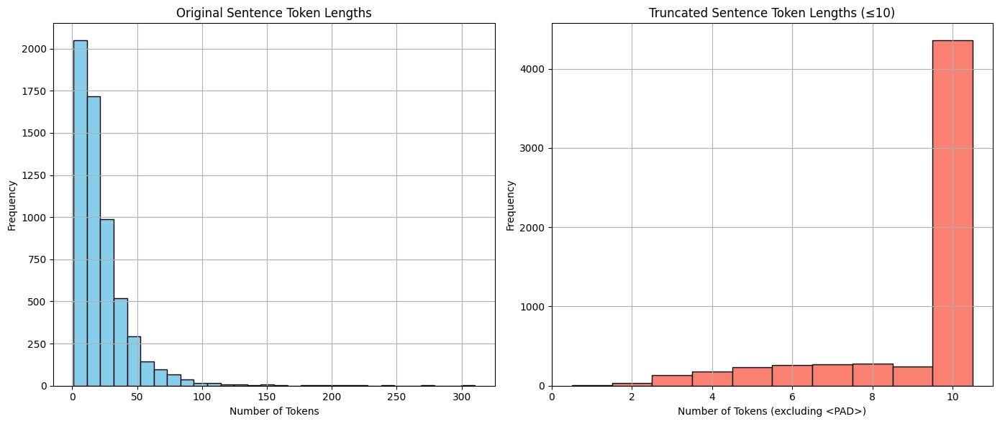

In [16]:
import matplotlib.pyplot as plt

# Calculate lengths
raw_lengths = [len(sentence.split()) for sentence in raw_sentences]
truncated_lengths = [len([token for token in sentence if token != "<PAD>"]) for sentence in padded_truncated]

# Plot side-by-side histograms
plt.figure(figsize=(14, 6))

# Raw sentence lengths
plt.subplot(1, 2, 1)
plt.hist(raw_lengths, bins=30, color='skyblue', edgecolor='black')
plt.title("Original Sentence Token Lengths")
plt.xlabel("Number of Tokens")
plt.ylabel("Frequency")
plt.grid(True)

# Truncated sentence lengths
plt.subplot(1, 2, 2)
plt.hist(truncated_lengths, bins=range(1, 12), color='salmon', edgecolor='black', align='left')
plt.title("Truncated Sentence Token Lengths (≤10)")
plt.xlabel("Number of Tokens (excluding <PAD>)")
plt.ylabel("Frequency")
plt.grid(True)

plt.tight_layout()
plt.show()

# TThis provides insight into the distribution of sentence lengths in my dataset, both before and after truncation


##2. Visualize Word Frequencies:

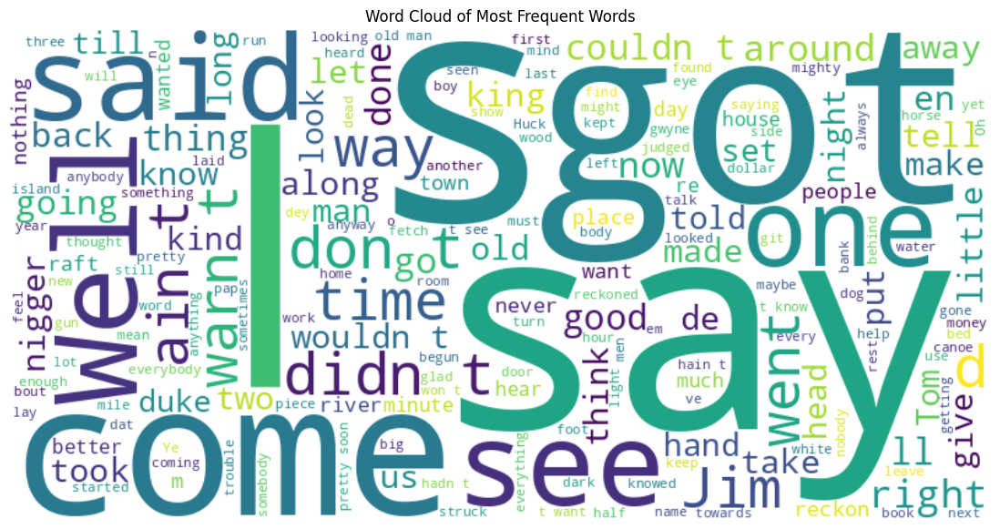

In [17]:
from wordcloud import WordCloud

# Create a word cloud from the cleaned text
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

# Plot the word cloud
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of Most Frequent Words")
plt.show()

# Words are sized by frequency in the text: bigger = more frequent.
# It's a quick visual way to see which words dominate your dataset.

# Final Project: Complete Text Preprocessing Pipeline

In [28]:
pipeline_code = """
import re
import nltk
nltk.download('punkt')

def clean_text(text):
    text = re.sub(r'\\.{2,}', '.', text)

    contractions = [
        "'s", "'m", "'re", "'ve", "'ll", "'d", "n't",
        "can't", "won't", "ain't", "let's", "ma'am", "o'clock", "y'all",
        "should've", "would've", "could've", "gonna", "wanna", "gotta",
        "lemme", "gimme", "kinda", "sorta", "dunno"
    ]

    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = re.sub(rf"\\b{re.escape(contraction)}\\b", placeholder, text, flags=re.IGNORECASE)

    text = re.sub(r'([—\\-.,:;?_!"()\\[\\]"\\'])', r' \\1 ', text)
    text = " ".join(text.split())

    for i, contraction in enumerate(contractions):
        placeholder = f"_CONTRACTION_{i}_"
        text = text.replace(placeholder, contraction)

    return text

def preprocessing_pipeline(raw_text, truncate_len=10):
    cleaned_text = clean_text(raw_text)
    sentences = nltk.sent_tokenize(cleaned_text)
    tokenized_sentences = [sentence.split() for sentence in sentences]
    padded_sentences = [
        tokens[:truncate_len] + ["<PAD>"] * max(0, truncate_len - len(tokens))
        for tokens in tokenized_sentences
    ]
    all_tokens = cleaned_text.split()
    vocab = {token: idx for idx, token in enumerate(sorted(set(all_tokens + ["<PAD>"])))}
    inv_vocab = {idx: token for token, idx in vocab.items()}
    encoded_sentences = [
        [vocab[token] for token in sentence]
        for sentence in padded_sentences
    ]
    return {
        "cleaned_text": cleaned_text,
        "tokenized": tokenized_sentences,
        "padded_tokens": padded_sentences,
        "encoded": encoded_sentences,
        "vocab": vocab,
        "inv_vocab": inv_vocab,
    }

def decode(encoded_sentence, inv_vocab):
    return [inv_vocab.get(idx, "<UNK>") for idx in encoded_sentence]
"""

with open("text_preprocessing_pipeline.py", "w") as f:
    f.write(pipeline_code)


In [29]:
from text_preprocessing_pipeline import *


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [30]:
url = "https://raw.githubusercontent.com/monkeybuzinis/LLM/refs/heads/main/data/The%20hardwood%20finisher%20%20with%20rules%20and%20directions%2C%20for%20finishing%20in%20natural%E2%80%A6.txt"
import urllib.request
urllib.request.urlretrieve(url, "huck.txt")

with open("huck.txt", "r", encoding="utf-8") as f:
    raw_text = f.read()

data = preprocessing_pipeline(raw_text)
print("Decoded example:", decode(data["encoded"][0], data["inv_vocab"]))


Decoded example: ['The', 'Project', 'Gutenberg', 'eBook', 'of', 'The', 'hardwood', 'finisher', 'This', 'ebook']
